# **Install library**

In [ ]:
pip install --upgrade librosa

# **Import library**

In [ ]:
import os
import librosa
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import librosa, IPython
import librosa.display as lplt

import keras as k
import tensorflow as tf
from sklearn.metrics import confusion_matrix, f1_score, accuracy_score, classification_report
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier

from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

from tensorflow import keras
from tensorflow.keras import layers

# **Import Dataset**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
genre_dir = '/content/drive/MyDrive/miniproject/Music Genre/genres_original'

In [ ]:
print(os.listdir(genre_dir))

['rock', 'reggae', 'blues', 'metal', 'classical', 'jazz', 'hiphop', 'country', 'disco', 'pop']


# **Feature Extraction**

In [ ]:
X = []  # Features
y = []  # Labels

In [ ]:
# Define the function to extract audio features (MFCCs)
def extract_features(audio_file):
    audio_signal, sample_rate = librosa.load(audio_file)
    mfccs = librosa.feature.mfcc(y=audio_signal, sr=sample_rate, n_mfcc=13)
    return mfccs.mean(axis=1)  # Calculate mean MFCCs across time

# Loop through genre subdirectories and audio files
for genre in os.listdir(genre_dir):
    genre_path = os.path.join(genre_dir, genre)
    if not os.path.isdir(genre_path):
        continue  # Skip non-directory entries

    for audio_file in os.listdir(genre_path):
        if audio_file.endswith('.wav'):
            audio_file_path = os.path.join(genre_path, audio_file)
            # Extract MFCC features
            features = extract_features(audio_file_path)

            # Append features and labels to the respective lists
            X.append(features)
            y.append(genre)

# Convert lists to NumPy arrays for further processing
X = np.array(X)
y = np.array(y)

# Encode genre labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# **Training, validation, and test sets split(70% - 20% - 10% )**

In [ ]:
X_train, X_temp, y_train, y_temp = train_test_split(X, y_encoded, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.33, random_state=42)

# **Build Model**

**Random Forest**

In [ ]:
# Standardize the feature vectors
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

In [ ]:
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train_scaled, y_train)

# Evaluate the model on the validation set
y_val_pred = model.predict(X_val_scaled)
val_accuracy = accuracy_score(y_val, y_val_pred)
print(f"Validation Accuracy: {val_accuracy:.2f}")

# Evaluate the model on the test set
y_test_pred = model.predict(X_test_scaled)
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Test Accuracy: {test_accuracy:.2f}")

class_report = classification_report(y_test, y_test_pred, target_names=label_encoder.classes_)
print("Classification Report:\n", class_report)


Validation Accuracy: 0.60
Test Accuracy: 0.55
Classification Report:
               precision    recall  f1-score   support

       blues       1.00      0.44      0.61        16
   classical       0.58      1.00      0.74         7
     country       0.20      0.33      0.25         6
       disco       0.71      0.45      0.56        11
      hiphop       0.25      0.40      0.31         5
        jazz       0.50      0.54      0.52        13
       metal       0.71      1.00      0.83        12
         pop       0.62      0.67      0.64        12
      reggae       0.29      0.33      0.31         6
        rock       0.50      0.18      0.27        11

    accuracy                           0.55        99
   macro avg       0.54      0.53      0.50        99
weighted avg       0.61      0.55      0.54        99



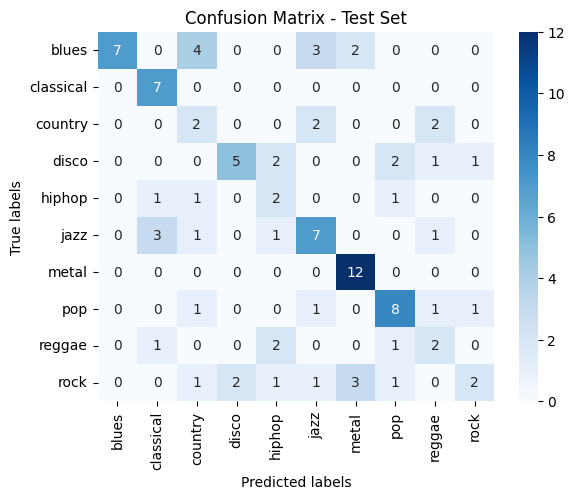

In [ ]:
conf_matrix = confusion_matrix(y_test, y_test_pred)

sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix - Test Set')
plt.show()

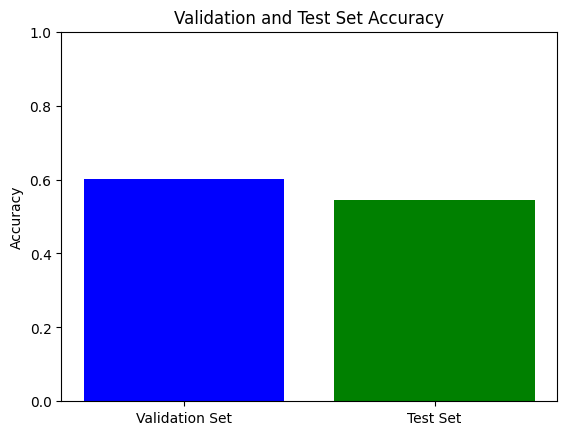

In [ ]:
labels = ['Validation Set', 'Test Set']
accuracies = [val_accuracy, test_accuracy]

plt.bar(labels, accuracies, color=['blue', 'green'])
plt.ylabel('Accuracy')
plt.title('Validation and Test Set Accuracy')
plt.ylim(0, 1)  # Set y-axis limit to 0-1 for accuracy
plt.show()


**SVM**

In [ ]:
svm_classifier = SVC(kernel='linear', C=1.0, random_state=42)

svm_classifier.fit(X_train, y_train)

predictions = svm_classifier.predict(X_test)

# Evaluate
svm_accuracy = accuracy_score(y_test, predictions)
svm_f1_score = f1_score(y_test, predictions, average='weighted')
svm_confusion_matrix = confusion_matrix(y_test, predictions)
svm_classification_report = classification_report(y_test, predictions)

print(f"Test Accuracy: {svm_accuracy:.2f}")
print(f"F1 score: {svm_f1_score:.2f}")

print("Classification Report:\n", svm_classification_report)

Test Accuracy: 0.49
F1 score: 0.48
Classification Report:
               precision    recall  f1-score   support

           0       0.70      0.44      0.54        16
           1       0.55      0.86      0.67         7
           2       0.11      0.17      0.13         6
           3       0.57      0.36      0.44        11
           4       0.33      0.40      0.36         5
           5       0.54      0.54      0.54        13
           6       0.71      1.00      0.83        12
           7       0.54      0.58      0.56        12
           8       0.14      0.17      0.15         6
           9       0.33      0.18      0.24        11

    accuracy                           0.49        99
   macro avg       0.45      0.47      0.45        99
weighted avg       0.51      0.49      0.48        99



**KNN**

In [ ]:
knn_classifier = KNeighborsClassifier()
knn_classifier.fit(X_train, y_train)
predictions = knn_classifier.predict(X_test)

# Evaluate
knn_accuracy = accuracy_score(y_test, predictions)
knn_f1_score = f1_score(y_test, predictions, average='weighted')
knn_confusion_matrix = confusion_matrix(y_test, predictions)
knn_classification_report = classification_report(y_test, predictions)

print(f"Test Accuracy: {knn_accuracy:.2f}")
print(f"F1 score: {knn_f1_score:.2f}")

print("Classification Report:\n", knn_classification_report)

Test Accuracy: 0.47
F1 score: 0.49
Classification Report:
               precision    recall  f1-score   support

           0       0.55      0.38      0.44        16
           1       0.64      1.00      0.78         7
           2       0.07      0.17      0.10         6
           3       0.50      0.45      0.48        11
           4       0.12      0.20      0.15         5
           5       0.60      0.46      0.52        13
           6       0.75      0.75      0.75        12
           7       0.67      0.50      0.57        12
           8       0.22      0.33      0.27         6
           9       0.80      0.36      0.50        11

    accuracy                           0.47        99
   macro avg       0.49      0.46      0.46        99
weighted avg       0.55      0.47      0.49        99



**CNN**

In [ ]:
# Reshape the input data for CNN
X_train_cnn = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_val_cnn = X_val.reshape(X_val.shape[0], X_val.shape[1], 1)
X_test_cnn = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

# Build the CNN model
model_2 = keras.Sequential([
    layers.Conv1D(64, kernel_size=3, activation='relu', input_shape=(X_train_cnn.shape[1], 1)),
    layers.MaxPooling1D(pool_size=2),
    layers.Conv1D(128, kernel_size=3, activation='relu'),
    layers.MaxPooling1D(pool_size=2),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(len(np.unique(y_encoded)), activation='softmax')  # Output layer with softmax activation for multi-class classification
])

# Compile the model
model_2.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model_2.fit(X_train_cnn, y_train, epochs=150, validation_data=(X_val_cnn, y_val), batch_size=32)

# Evaluate the model on the test set
test_loss, test_accuracy = model_2.evaluate(X_test_cnn, y_test)
print(f"Test Accuracy: {test_accuracy:.2f}")

# Generate a classification report for the test set (optional)
y_test_pred = np.argmax(model_2.predict(X_test_cnn), axis=1)
class_report = classification_report(y_test, y_test_pred, target_names=label_encoder.classes_)
print("Classification Report:\n", class_report)

Epoch 1/150
22/22 [==============================] - 2s 22ms/step - loss: 3.0272 - accuracy: 0.2003 - val_loss: 1.8553 - val_accuracy: 0.3532
Epoch 2/150
22/22 [==============================] - 0s 7ms/step - loss: 1.9360 - accuracy: 0.2947 - val_loss: 1.6250 - val_accuracy: 0.4129
Epoch 3/150
22/22 [==============================] - 0s 7ms/step - loss: 1.7495 - accuracy: 0.3705 - val_loss: 1.5502 - val_accuracy: 0.4279
Epoch 4/150
22/22 [==============================] - 0s 8ms/step - loss: 1.6220 - accuracy: 0.4177 - val_loss: 1.5189 - val_accuracy: 0.4527
Epoch 5/150
22/22 [==============================] - 0s 8ms/step - loss: 1.5919 - accuracy: 0.4392 - val_loss: 1.4882 - val_accuracy: 0.4876
Epoch 6/150
22/22 [==============================] - 0s 7ms/step - loss: 1.5009 - accuracy: 0.4721 - val_loss: 1.5093 - val_accuracy: 0.4627
Epoch 7/150
22/22 [==============================] - 0s 8ms/step - loss: 1.4900 - accuracy: 0.4549 - val_loss: 1.4745 - val_accuracy: 0.5124
Epoch 8/150


# **Test model**

In [ ]:
test_1 = "/content/drive/MyDrive/miniproject/Taylor_Swift_BlankSpace.com.mp3"
audio_data, sr = librosa.load(test_1)
audio_data, _ = librosa.effects.trim(audio_data)

In [ ]:
IPython.display.Audio(audio_data, rate=sr)

In [ ]:
uploaded_features = extract_features(test_1)
uploaded_features_scaled = scaler.transform(np.array([uploaded_features]))
predicted_label = model.predict(uploaded_features_scaled)[0]
decoded_label = label_encoder.inverse_transform([predicted_label])[0]
print(f"Predicted Genre: {decoded_label}")

Predicted Genre: pop


# **Save Model**

In [ ]:
import joblib
import sklearn

model = joblib.load('genre_model.joblib')

# ดู scikit-learn version ที่ใช้สร้างโมเดล
print(sklearn.__version__)

# ดู scikit-learn version ปัจจุบัน
import sklearn
print(sklearn.__version__)

if sklearn.__version__ != sklearn.__version__:
  print("Version mismatch!")
else:
  print("Version matched")

1.2.2
1.2.2
Version matched


In [ ]:
pip install scikit-learn==1.2.2

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# สร้างโมเดลและ train ใหม่
rf = RandomForestClassifier()
rf.fit(X_train, y_train)

# บันทึกโมเดลใหม่
import joblib
joblib.dump(rf, 'genre_model_new.joblib')

['genre_model_new.joblib']

In [ ]:
import joblib
model = joblib.load('genre_model_new.joblib')